### This script find the missing trial triggers (5), and added them to raw data.

In [1]:
from speech_pinyin.config import *
import glob
import mne
import numpy as np
from utils.util_MNE import keep_annotation
import matplotlib.pylab as plt

2024-09-03 23:31:41 - Start Program

pre_all: Running from CMD.
common_dl.py: Using CUDA.


In [2]:
sid=1
folder=data_dir+str(sid)+'-*'
folder=os.path.normpath(glob.glob(folder)[0])
folder=folder.replace("\\", "/")

### Session 1

In [65]:
raw1=mne.io.read_raw_fif(folder+'/processed/session1.fif')

In [66]:
annotations1=raw1.annotations
annotations1=keep_annotation(annotations1,['1', '8', '10', '5', '2'])
raw1.set_annotations(annotations1)
print(len(annotations1)) # 144， including all annotations

144


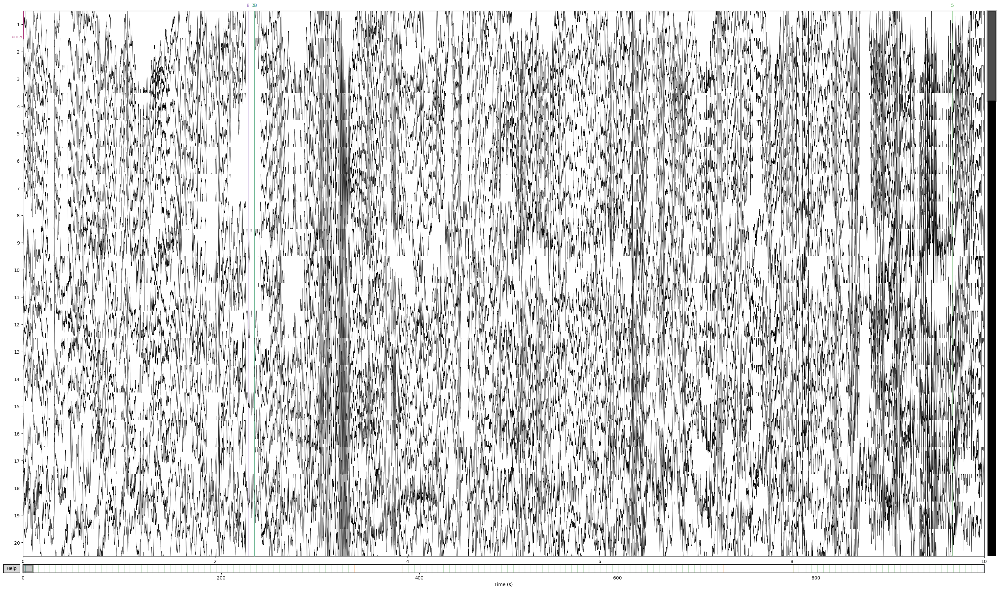

In [54]:
%matplotlib qt
raw1.plot()

In [67]:
len(keep_annotation(annotations1.copy(),['1', '8', '10', '2'])) # 7 of non-trial annotations, means 7 trial triggers are missing

7

In [68]:
# Find missing triggers
# approx trial length=5.75s
trial_interval=5.75
missings = [[215, 222], [300, 309], [397, 405], [485, 492],[692,699],[779,787],[833,840]]
insert = []
for m in missings:
    for n in annotations1:
        if n['description']==str(5):
            if m[0] + raw1.first_time < n['onset'] + trial_interval < m[1] + raw1.first_time:
                insert.append(n['onset'] + trial_interval)  # s
print(len(insert))

7


In [69]:
# Add the missing triggers
onsets=[]
durations=[]
descriptions=[]
for i in insert:
    onsets.append(i)
    durations.append(0)
    descriptions.append('5')
anno_missing=mne.Annotations(onset=onsets,duration=durations,description=descriptions,orig_time=annotations1[0]['orig_time'])# 106=102triggers+4pauses
anno_comb=annotations1.__add__(anno_missing)
raw1.set_annotations(anno_comb)

Measurement date,"August 28, 2024 08:33:34 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"120 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.50 Hz
Lowpass,495.00 Hz


In [60]:
# sequence of 5 and 2 (pause)
anno_pause=keep_annotation(anno_comb,['2','5'])
sequence=[int(a['description']) for a in anno_pause]
pause_index=[ i for i,v in enumerate(sequence) if v==2]
pause_index=pause_index[0:-1:2] # [57, 114]; these trials should be discarded because experiment paused during the trial

In [70]:
# only keep trigger 5
anno_comb=keep_annotation(anno_comb,'5')
raw1.set_annotations(anno_comb)

Measurement date,"August 28, 2024 08:33:34 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"120 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.50 Hz
Lowpass,495.00 Hz


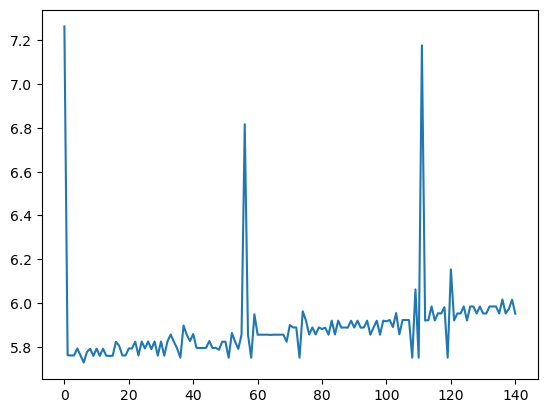

In [31]:
%matplotlib inline
#TODO: not the right way to calculate length. Check method used in session 3.
intervals=[]
triggers=keep_annotation(anno_comb,'5')
for i in range(len(triggers)-1):
    tmp=triggers[i+1]['onset']-triggers[i]['onset']
    if tmp<10:
        intervals.append(tmp)
plt.plot(intervals) # seems the trigger is not stable: takes longer as experiment goes

In [76]:
## epoch: 7 seconds after trigger
all_events, all_event_id = mne.events_from_annotations(raw1)
epochs1 = mne.Epochs(raw1, all_events, tmin=0, tmax=7,baseline=None)
filename=folder+'/processed/session1-epo.fif'
epochs1.save(filename, overwrite=True)

### Session 2

In [11]:
raw2=mne.io.read_raw_fif(folder+'/processed/session2.fif')
annotations2=raw2.annotations
annotations2=keep_annotation(annotations2,['1', '8', '10', '5', '2'])
raw2.set_annotations(annotations2)
print(len(annotations2)) # 149， including all annotations

149


In [12]:
len(keep_annotation(annotations2.copy(),['1', '8', '10', '2'])) # 6; 149-6=143; not 144, missing 1 trial trigger

6

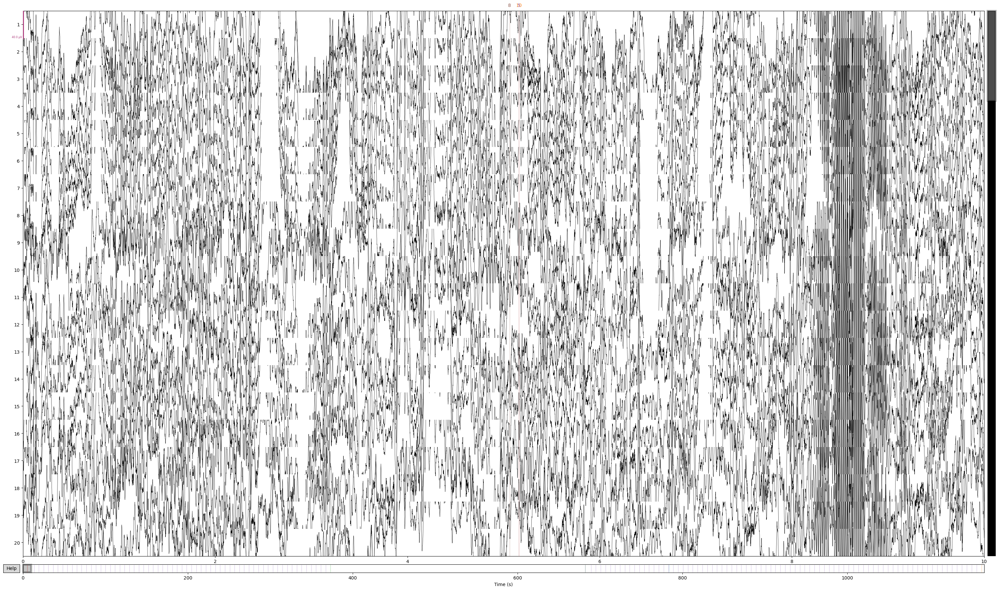

In [32]:
%matplotlib qt
raw2.plot()

In [13]:
# approx trial length=5.75s
trial_interval=5.75
missings = [[784, 792]]
insert = []
for m in missings:
    for n in annotations2:
        if n['description']==str(5):
            if m[0] + raw2.first_time < n['onset'] + trial_interval < m[1] + raw2.first_time:
                insert.append(n['onset'] + trial_interval)  # s
print(len(insert))

1


In [15]:
onsets=[]
durations=[]
descriptions=[]
for i in insert:
    onsets.append(i)
    durations.append(0)
    descriptions.append('5')
anno_missing=mne.Annotations(onset=onsets,duration=durations,description=descriptions,orig_time=annotations2[0]['orig_time'])# 106=102triggers+4pauses
anno_comb=annotations2.__add__(anno_missing)
raw2.set_annotations(anno_comb)

Measurement date,"August 28, 2024 08:33:34 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"120 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.50 Hz
Lowpass,495.00 Hz


In [16]:
# sequence of 5 and 2 (pause)
tmp=keep_annotation(anno_comb,['2','5'])
sequence=[int(a['description']) for a in tmp]
pause_index=[ i for i,v in enumerate(sequence) if v==2]
pause_index=pause_index[0:-1:2]
print(pause_index)

[63]


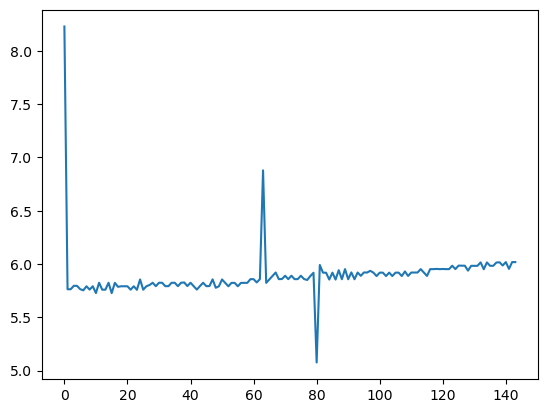

In [38]:
%matplotlib inline
#TODO: not the right way to calculate length. Check method used in session 3.
intervals=[]
triggers=keep_annotation(anno_comb,'5')
for i in range(len(triggers)-1):
    tmp=triggers[i+1]['onset']-triggers[i]['onset']
    if 4<tmp<10:
        intervals.append(tmp)
plt.plot(intervals)

In [83]:
# sequence of 5 and 2 (pause)
anno_pause=keep_annotation(anno_comb,['2','5'])
sequence=[int(a['description']) for a in anno_pause]
pause_index=[ i for i,v in enumerate(sequence) if v==2]
pause_index=pause_index[0:-1:2]
print(pause_index)

[63]


In [84]:
# only keep trigger 5
anno_comb=keep_annotation(anno_comb,'5')
print(len(anno_comb))
raw2.set_annotations(anno_comb)

144


Measurement date,"August 28, 2024 08:33:34 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"120 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.50 Hz
Lowpass,495.00 Hz


In [85]:
## epoch: 7 seconds after trigger
all_events, all_event_id = mne.events_from_annotations(raw2)
epochs2 = mne.Epochs(raw2, all_events, tmin=0, tmax=7,baseline=None)
filename=folder+'/processed/session2-epo.fif'
epochs2.save(filename, overwrite=True)

#filename=folder+'/raw/session2_trigger_added.fif'
#raw2.save(filename,overwrite=True)

### Session 3: 3 pauses, missing 1 trigger '5'.

In [3]:
raw3=mne.io.read_raw_fif(folder+'/processed/session3.fif')
annotations3=raw3.annotations
annotations3=keep_annotation(annotations3,['1', '8', '10', '5', '2'])
raw3.set_annotations(annotations3)
print(len(annotations3)) # 152， including all annotations

152


In [4]:
len(keep_annotation(annotations3.copy(),['1', '8', '10', '2'])) # 9; 152-9=143; not 144, missing 1 trial trigger;

9

In [5]:
len(keep_annotation(annotations3.copy(),['5']))

143

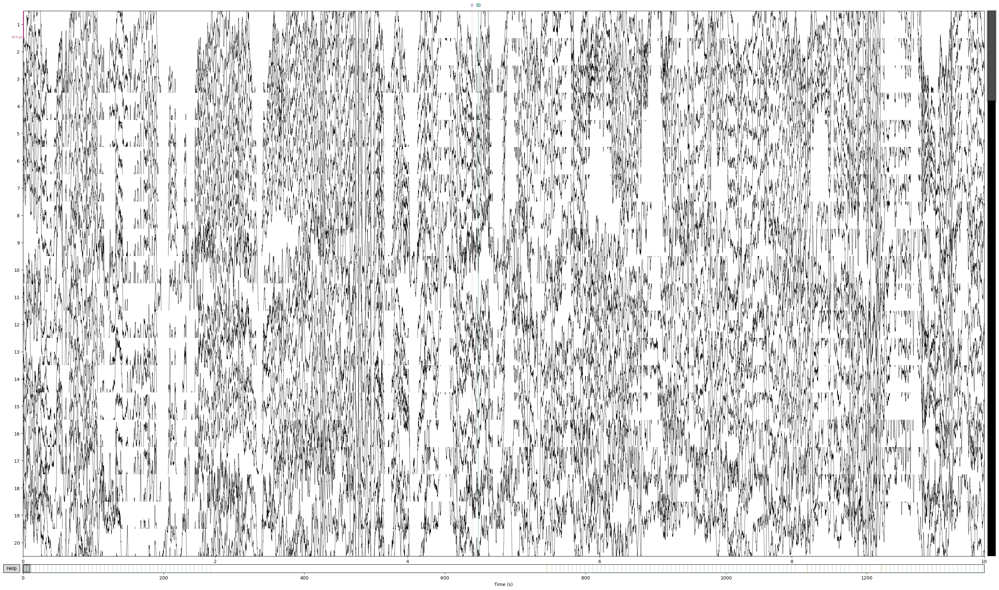

In [11]:
%matplotlib qt
raw3.plot()

In [6]:
# Find the missing triggers
# approx trial length=5.75s
trial_interval=5.75
missings = [[1176, 1184]] # the 115th trial
insert = []
for m in missings:
    for n in annotations3:
        if n['description']==str(5):
            if m[0] + raw3.first_time < n['onset'] + trial_interval < m[1] + raw3.first_time:
                insert.append(n['onset'] + trial_interval)  # s

In [7]:
# Add the missing triggers
onsets=[]
durations=[]
descriptions=[]
for i in insert:
    onsets.append(i)
    durations.append(0)
    descriptions.append('5')
anno_missing=mne.Annotations(onset=onsets,duration=durations,description=descriptions,orig_time=annotations3[0]['orig_time'])# 106=102triggers+4pauses
anno_comb=annotations3.__add__(anno_missing)
raw3.set_annotations(anno_comb)

Measurement date,"August 28, 2024 08:33:34 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"120 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.50 Hz
Lowpass,495.00 Hz


In [8]:
anno_trials=keep_annotation(anno_comb,['5']) # 144
print(len(anno_trials))
anno_pause=keep_annotation(anno_comb,['2'])
print(len(anno_pause))
anno_end=keep_annotation(anno_comb,['10'])
print(len(anno_end))
'''
# Add '5' at pausing begining as trial end (the first '2' of a pause)
onsets=[tmp['onset'] for tmp in [anno_pause[0],anno_pause[2],anno_pause[4]]]
durations=[0,]*len(onsets)
descriptions=['5']*len(onsets)
tmp = mne.Annotations(onset=onsets, duration=durations, description=descriptions, orig_time=anno_comb[0]['orig_time'])
anno_trials = anno_trials.__add__(tmp) # 147
'''
#raw1.set_annotations(ann_comb)

144
6
2


"\n# Add '5' at pausing begining as trial end (the first '2' of a pause)\nonsets=[tmp['onset'] for tmp in [anno_pause[0],anno_pause[2],anno_pause[4]]]\ndurations=[0,]*len(onsets)\ndescriptions=['5']*len(onsets)\ntmp = mne.Annotations(onset=onsets, duration=durations, description=descriptions, orig_time=anno_comb[0]['orig_time'])\nanno_trials = anno_trials.__add__(tmp) # 147\n"

In [9]:
# find the index of trials that follows a pause '2'
anno_comb2=keep_annotation(anno_comb,['2','5'])
index2in5=[]
index5=[]
pause_after_these=[]
j=0 # index event '5'
for i in range(len(anno_comb2)):
    if i<len(anno_comb2)-1:
        if anno_comb2[i]['description']=='5':
            index5.append(j)
            if anno_comb2[i+1]['description']=='2':
                offset=anno_comb2[i+1]['onset']-anno_comb2[i]['onset']
                if offset>4:
                    index2in5.append(j)
            j=j+1
    elif i==len(anno_comb2)-1:
        if anno_comb2[i]['description']=='5':
            index5.append(j)

print(index2in5) # Three pauses are followed these trials: [44, 104, 119]
print(len(index5))


[44, 104, 119]
144


In [10]:
# Above can be confirmed by the '2' index in the combined list of '2' and '5'
tmp=keep_annotation(anno_comb,['2','5'])
sequence=[int(a['description']) for a in tmp]
pause_index=[ i for i,v in enumerate(sequence) if v==2]
pause_index=pause_index[0:-1:2]
print(pause_index)

[45, 107, 124]


In [9]:
# Add the final '10' as the trial end
'''
onsets=[anno_end[1]['onset']]
durations=[0,]*len(onsets)
descriptions=['5']*len(onsets)
tmp = mne.Annotations(onset=onsets, duration=durations, description=descriptions, orig_time=anno_comb[0]['orig_time'])
anno_trials = anno_trials.__add__(tmp) # 148
'''

In [64]:
event5,_=mne.events_from_annotations(raw3,regexp='5')
event2,_=mne.events_from_annotations(raw3,regexp='2')
event10,_=mne.events_from_annotations(raw3,regexp='10')

event5=event5[:,0]-[raw3.first_samp]*len(event5)
event2=event2[:,0]-[raw3.first_samp]*len(event2)
event10=event10[:,0]-[raw3.first_samp]*len(event10)

In [56]:
data=raw3.get_data()
data.shape

(121, 1367001)

144


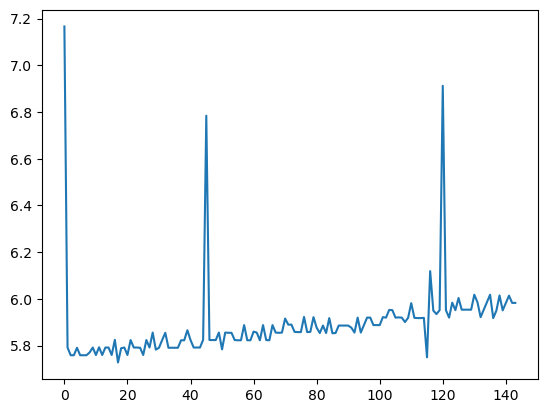

In [73]:
%matplotlib inline
#triggers=keep_annotation(anno_comb,'5')
intervals=[]
counting=[]
trials_list=[]
for i in range(len(event5)):
    if i<44 or 44<i<104 or 104<i<119 or 119<i<len(event5)-1:
        end=event5[i+1]
        start=event5[i]
    elif i==44:
        end=event2[0]
        start=event5[i]
    elif i==104:
        end=event2[2]
        start=event5[i]
    elif i==119:
        end=event2[4]
        start=event5[i]
    elif i==len(event5)-1:
        end=event10[-1]
        start=event5[i]# use the previous length
    if 4<tmp<10:
        counting.append(i)
        tmp=(end-start)/1000
        intervals.append(tmp)
        trial=data[:,start:end]
        trials_list.append(trial.transpose())
    
print(len(intervals))
plt.plot(intervals)

In [74]:
filename=folder+'/processed/session3_trial_length_EEG.npy'
np.save(filename, np.array(intervals, dtype=object), allow_pickle=True)

filename=folder+'/processed/session3_trials_list.npy'
np.save(filename, np.array(trials_list, dtype=object), allow_pickle=True)

144


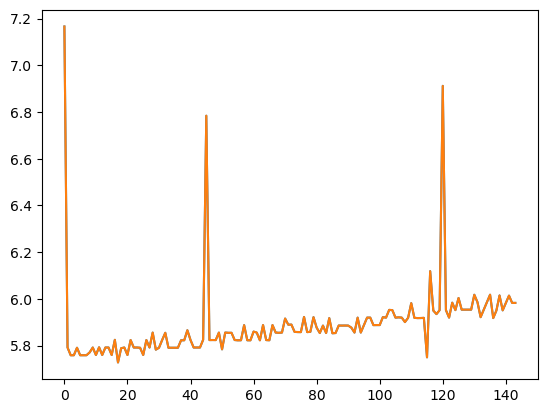

In [69]:
# Use event instead, as shown above, which is more accurate because it uses sample instead of time. These two results are the same, except the accuracy.
'''
#triggers=keep_annotation(anno_comb,'5')
intervals2=[]
counting=[]
for i in range(len(anno_trials)):
    if i<44 or 44<i<104 or 104<i<119 or 119<i<len(anno_trials)-1:
        end=anno_trials[i+1]['onset']
        start=anno_trials[i]['onset']
    elif i==44:
        end=anno_pause[0]['onset']
        start=anno_trials[i]['onset']
    elif i==104:
        end=anno_pause[2]['onset']
        start=anno_trials[i]['onset']
    elif i==119:
        end=anno_pause[4]['onset']
        start=anno_trials[i]['onset']
    elif i==len(anno_trials)-1:
        end=anno_end[-1]['onset']
        start=anno_trials[i]['onset'] # use the previous length
    trial=raw3.copy().crop(start-raw3.first_time,end-raw3.first_time)
    tmp=end-start
    if 4<tmp<10:
        counting.append(i)
        intervals2.append(tmp)
print(len(intervals2))
plt.plot(intervals)
plt.plot(intervals2)
#filename=folder+'/processed/session3'+'_trial_length_EEG.npy'
#np.save(filename, np.array(intervals, dtype=object), allow_pickle=True)
'''

In [10]:
'''
# only keep trigger 5
anno_comb=keep_annotation(anno_comb,'5')
print(len(anno_comb))
raw3.set_annotations(anno_comb)
'''

144


Measurement date,"August 28, 2024 08:33:34 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"120 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.50 Hz
Lowpass,495.00 Hz


In [68]:
# formatted raw data
#TODO: no need for below anymore: the data was saved as a list of trials. So, no need to have trigger anymore.
#filename=folder+'/processed/session3_trigger_added-raw.fif'
#raw3.save(filename,overwrite=True)

In [115]:
# ## epoch: 7 seconds after trigger
# # TODO: this can be done later
# all_events, all_event_id = mne.events_from_annotations(raw3)
# epochs3 = mne.Epochs(raw3, all_events, tmin=0, tmax=7,baseline=None)
# filename=folder+'/processed/session3-epo.fif'
# epochs3.save(filename, overwrite=True)


### According to Zhao Haifeng, the find_events should be used, instead of events_from_annotations, because find_events check voltage patterns which could be slightly different from annotations. Let's try it out.

### Issue: Only a few of the events were found by the find_events function.

### Possible reason: no delay while sending a trigger; should hold for a while before pull back to zero.


In [3]:
raw3=mne.io.read_raw_fif(folder+'/processed/session3.fif')
annotations3=raw3.annotations
annotations3=keep_annotation(annotations3,['1', '8', '10', '5', '2'])
raw3.set_annotations(annotations3)
print(len(annotations3)) # 152， including all annotations

152


In [15]:
events=mne.find_events(raw3,stim_channel='Trigger')
print(len(events))

21


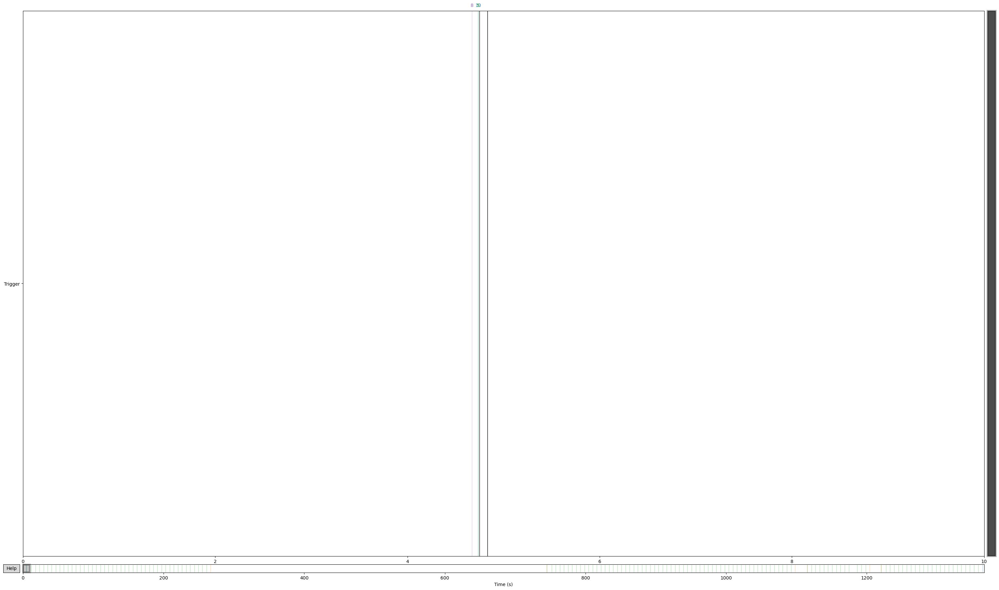

In [12]:
%matplotlib qt
raw3.plot(picks=['Trigger'])